# Hyperspectral imaging in animal coloration research: a user-friendly pipeline for image generation, analysis and integration with 3D modeling
Author: Benedict G. Hogan 2024

Scripts/code to replicate the hyperspectral analyses of the main text and supplemental materials. Requires
raw hyperspectral data (and separately generated metadata files) which can be found at https://doi.org/10.5061/dryad.j0zpc86nf

In [ ]:
# Import some useful packages
import os
import matplotlib
import matplotlib.pyplot as plt
import spectral.io.envi as envi
import numpy as np

from scipy import io as sio # only used to load matlab files
from scipy.stats import median_abs_deviation # only used in plot of tail colors I think
from PIL import Image # for udlr # only used in udlr
from plotly.subplots import make_subplots # tetrahedral plots
import seaborn as sns # 2d KDE plots, can also make 2d scatter coloring by factor easier
import pandas as pd # used to generate dataframes/csvs of spectra

In [2]:
# Import the generic code for this paper
import hsi.tetra as tetra
import hsi.utils as utils
import hsi.triangle as triangle

# import the modules of custom code for this paper
import bop_analysis
import bop_sampling
import bop_plotting
import bop_udlr

# print(dir(tetra)) # show the functions loaded in Util

In [3]:
# Set some defaults for plotting
%matplotlib inline
matplotlib.rcParams['font.serif'] = "Times New Roman"
matplotlib.rcParams['font.family'] = "serif"
matplotlib.rcParams['backend'] = 'Cairo' 

In [4]:
# Define color and label for each species throughout
label_dict = dict({'CM_M': 'M',
                  'CR_M': 'K',
                  'H_M': 'H'})

color_dict = dict({'CM_M':[230/255,159/255,0/255],
                  'CR_M':[0/255,158/255,115/255],
                  'H_M': [86/255,180/255,233/255]})

In [5]:
# Generate lookup table for the raw data (HSI images: .bil, associated headers: .hdr, and separately generated metadata: .mat)
# The latter contains binary masks for each patch on the bird, as defined in the SI, as well as the location and radius of the 99%
# standard. It has some other metadata that are not used. One could generate all these metadata natively in python.

lookin = ["../dat/hyperspectral_images/", # places to look for the data, please update to the directory/ies to which you download the data
          "../dat/matmask/", ] # including .bil, .hdr, and .mat files

udlr_dir = "../dat/Renders/MetaDepthNormal/"

# the directory argument lets you select different categories of data as listed in each of these text files
datafiles = bop_analysis.LookUpData(open("../dat/Normal_hyperspectral_images.txt", "r"), lookin) 
# datafiles = LookUpData(open("../dat/Tail_hyperspectral_images.txt", "r"), lookin) 
# datafiles = LookUpData(open("../dat/Tilted_hyperspectral_images.txt", "r"), lookin) 

# datafiles
utils.CheckFileMatch(datafiles['matfiles'], datafiles['bilfiles'], datafiles['hdrfiles'])

Filenames match, okay to continue


In [1]:
# The script below runs across all patches, species, and specimens sampling spectra as explained in the main paper.
# This works on normal, tail, and tilted hyperspectral datasets.
# These samples are then embedded in a few different ways, and human and bird color simulations are generated for each.
# We then pickle those data, so we only have to run this analysis once. That's good, because it is not particularly rapid (~1 hr)

# argument 'force' can be used to force reanalysis to regenerate picked processed data
bop_analysis.RunDataAnalysis(lookin, udlr_dir, force = False, mainplots = True, additionalplots = False, label_dict = label_dict, color_dict = color_dict, color_scale = 3)

In [8]:
# THE REST OF THE CODE BELOW PRODUCES DIAGRAMATTIC AND OTHERWISE INTERESTING PLOTS, SOME OF WHICH APPEAR IN THE PAPER
# The below also serves as additional examples of hsi data manipulation and plotting

In [6]:
# Load example hyperspectral image for basic processing
image_example = 0 # first image in our dataset
# Load image as memfile, get wl (band centers for the hsi channels) 
img = envi.open(datafiles["hdrfiles"][image_example], datafiles["bilfiles"][image_example])
owl = img.bands.centers

# Import our matlab generated image metadata (one could easily generate these metadata in python, and save them in pickle files)
mat_contents = sio.loadmat(datafiles["matfiles"][image_example], struct_as_record=False, squeeze_me=True)
mat_contents = mat_contents['ImStruct']
mask = mat_contents.masklist[0] # extract a binary mask for the 'whole' patch

# see all attributes saved in metadata, not all of these are used in the analysis but might be useful
# dir(mat_contents)
# print(mat_contents.bwlist)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


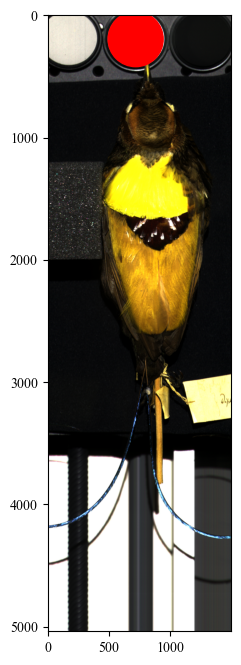

In [11]:
# Plot an RGB representation of our example image
fig, ax, rgb_im = utils.PlotFalseRGB(img, r = 600., g = 550., b = 425., standard_100 = mat_contents.ref99, plotme = True, normalize_max = .4)

# get standard location and diameter from (separately generated metadata), and overplot a red circle over the whole standard
if mat_contents.standardLocation.shape == (2,3):
    y, x, d = mat_contents.standardLocation[1]
else:
    y, x, d = mat_contents.standardLocation
circ = plt.Circle((y,x), d, color = 'r' )
ax.add_patch(circ)


Selected 2028 samples


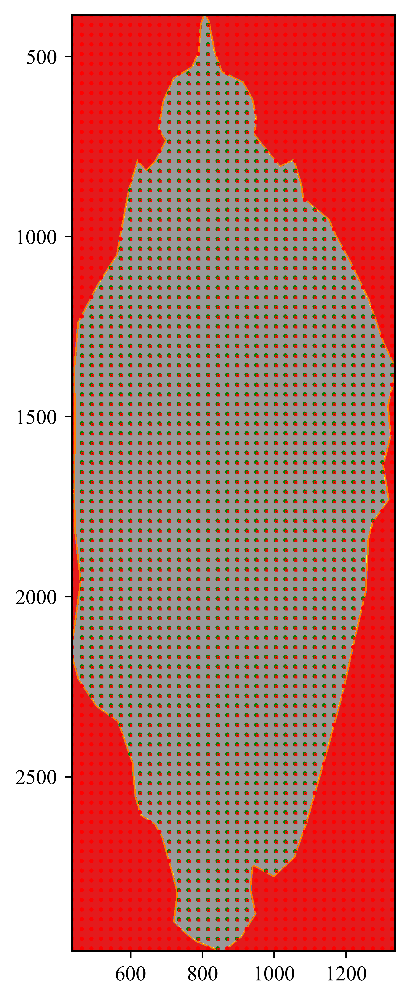

Samples need averaging
Processing and averaging


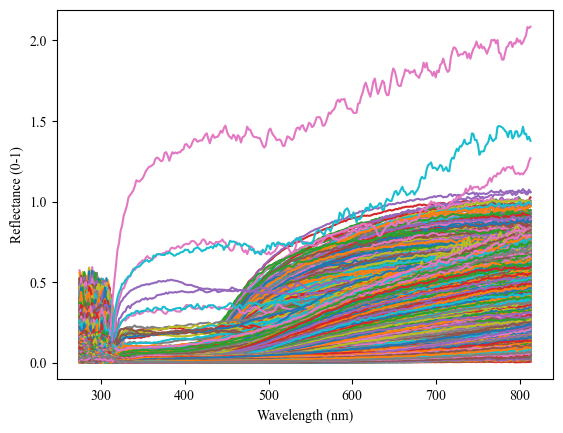

Cutting original spectra to >325
Filtering spectra with savgol_filter, extrapolation will use pchip
Interpolated spectra to 1nm from 325 to 700
Spectra now 300 to 700


In [8]:
# As an example:
# For a given patch (whole) on this example image, collect desired n samples (approx), and process + plot those spectra
desire = 2000 # how many samples we want
n_ext = 5 # how much spatial averaging to do

# work out x and y locations for samples
xs, ys = utils.SampleSelection(mask, desire, n_ext, plotme = True, res = 800)

# read those spectra
Spec = utils.ReadBands(img, xs, ys, n_ext)
Spec = Spec / mat_contents.ref99[None,:] # spectral calibration by division by the median spectrum of a square centered on the 99% standard (saved in metadata)
utils.PlotSpec(img, xs, ys, Spec)
         
# interp and extrap wl
wl, Spec = utils.InterpExtrapSample(owl, Spec)

Samples need averaging
Processing and averaging
Cutting original spectra to >325
Filtering spectra with savgol_filter, extrapolation will use pchip
Interpolated spectra to 1nm from 325 to 700
Spectra now 300 to 700


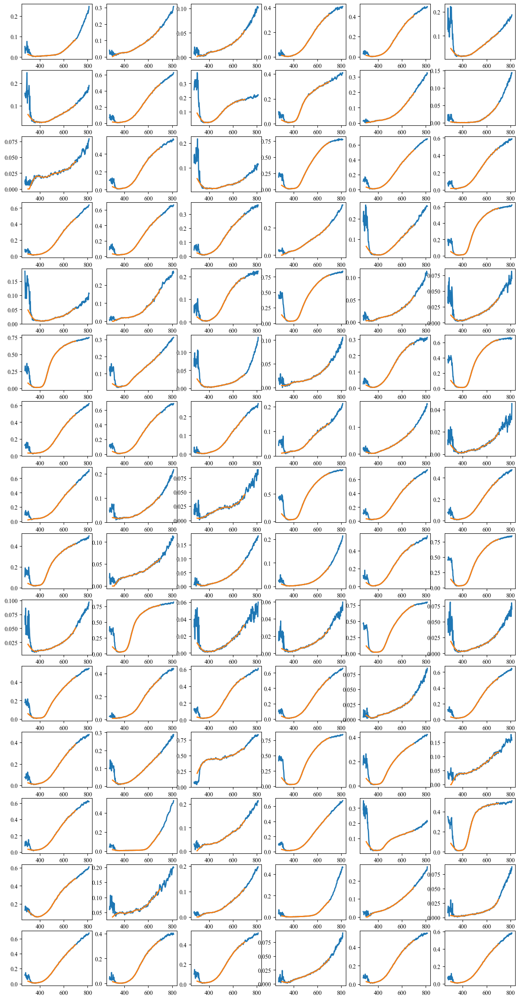

In [9]:
## Here we'll plot an overview of some of the spatially averaged but otherwise 'raw' data, along with the
# interpolated, filtered and extrapolated (<325nm, cubic sline) spectra that we use for our analysis.
# Here, use use a window length of 45nm, which is quite wide, but since our data don't contain many very peaky colors
# is not very harmful, and makes our plots more aesthetic. You can experiment with differing window lengths here.

Spec = utils.ReadBands(img, xs, ys, n_ext)
Spec = Spec / mat_contents.ref99[None,:] # spectral calibration

# Interpolate to 1nm, and extrapolate 300-325 nm
wl_inter, Spec_inter = utils.InterpExtrapSample(owl, Spec, np.arange(325, 701, 1),  wlout = np.arange(300, 701, 1), window_length = 45)

# Plot the raw and interpolated data
seed = np.random.seed(1)
randint = np.random.randint(0, Spec.shape[0], 500)
fig, axs = plt.subplots(15, 6, figsize = (15, 30))
for i, ax in enumerate(fig.axes):
    ax.plot(img.bands.centers, Spec[randint[i],:], linewidth=2.0) # show interpolated line
    ax.plot(wl_inter, Spec_inter[randint[i],:],linewidth=2.0) # show exrapolated line
plt.show()

# Retain interpolated data for remaining examples
wl = wl_inter
Spec = Spec_inter

if image_example == 0:
    fig.savefig('../out/Figures/Smooth_overlay.png', dpi = 100)
    fig.savefig('../out/Figures/Smooth_overlay.pdf', dpi = 100)

Generating colors
Sample in colour-science format
Colors generated


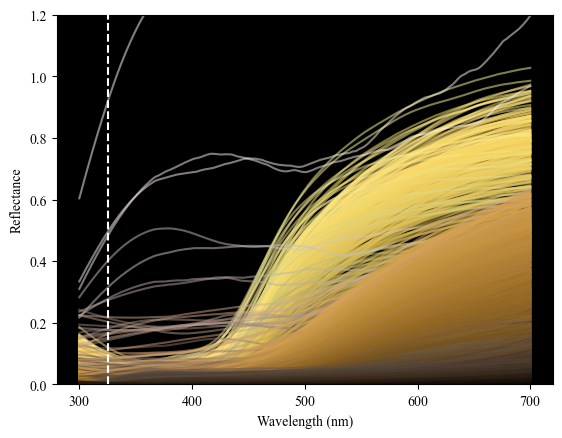

In [14]:
# As an example, get color representations for those spectra - note some numpy versions work very slowly with the colour-science package
XYZ, sRGB, Lab = utils.GetColors(Spec, wl, color_scale = 1.2)

# We can now plot sRGB colored versions of those spectra
fig, ax = plt.subplots(1)
ax.vlines(325, 0, 1.2, colors='White', linestyles='dashed', zorder=3)
# plot lines
for p in range(Spec.shape[0]):
        ax.plot(wl, Spec[p,:], alpha = 0.5, color = sRGB[p,:])
ax.set_xlabel('Wavelength (nm)')
ax.set_ylabel('Reflectance')
ax.set_ylim((0, 1.2))
ax.set_facecolor('black')
ax.set_xticks(np.arange(300, 701, 100))

In [15]:
# get avian vision cone stimulations for each sampled spectrum (currently average VS visual system) 
usml, relusml, txyz = utils.Spec2usml(Spec, wl) 

# plot the spectra in an interactive 3d tetrahedral color space
fig = make_subplots(rows=1, cols=1, specs=[[{"type": "scene"}]])
tetra.tetra3d(fig)
tetra.points3dColor(fig, txyz, sRGB = sRGB)
fig.show()

Got USML + relative USML


Computing umap on coordinates
UMAP done in 10.843393087387085


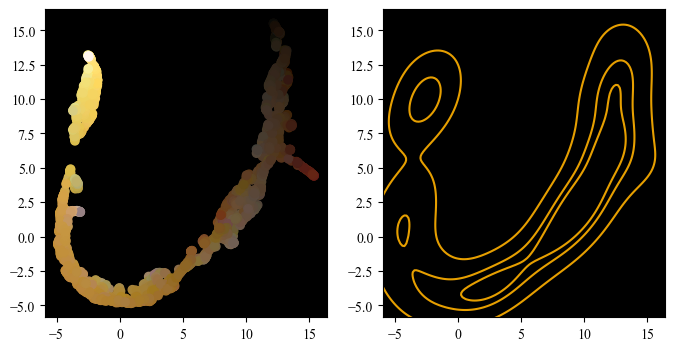

In [16]:
# We cam embed our spectral distances in lower dimensional spaces, in this case we run a PCA on sampled spectra, and 
# embed the PCA coordinates using umap, we then plot the distribution, and a kernel density representation of that distribution

spec_pca = utils.EmbedPCA(Spec) # pca
pltd = utils.EmbedDist(Coordinates = spec_pca, verbose = 0) # umap

fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (8, 4))
ax[0].scatter(x = pltd[:,0], y = pltd[:,1], c = sRGB)
ax[0].set_facecolor('xkcd:black')
    
# get limits
left, right = ax[0].get_xlim()
bottom, top = ax[0].get_ylim()

# kernel density plot
sns.kdeplot(x = pltd[:,0], 
        y = pltd[:,1], 
        fill=False, 
        thresh=0, 
        color = color_dict.get('CM_M'),
        common_norm = False, 
        legend = False,
        levels=[0.2, 0.6, 0.8],
        ax=ax[1])

ax[1].set_facecolor('xkcd:black')

ax[1].set_xlim(left, right)
ax[1].set_ylim(bottom, top)
plt.subplots_adjust(hspace = 0.1)

[ 330.  350.  370.  390.  410.  430.  450.  470.  490.  510.  530.  550.
  570.  590.  610.  630.  650.  670.  690.  710.]
Working on 0 of 20
Working on 1 of 20
Working on 2 of 20
Working on 3 of 20
Working on 4 of 20
Working on 5 of 20
Working on 6 of 20
Working on 7 of 20
Working on 8 of 20
Working on 9 of 20
Working on 10 of 20
Working on 11 of 20
Working on 12 of 20
Working on 13 of 20
Working on 14 of 20
Working on 15 of 20
Working on 16 of 20
Working on 17 of 20
Working on 18 of 20
Working on 19 of 20
0
Samples need averaging
Processing and averaging
Cutting original spectra to >325
Filtering spectra with savgol_filter, extrapolation will use pchip
Interpolated spectra to 1nm from 325 to 700
Spectra now 300 to 700
Generating colors
Sample in colour-science format
Colors generated
1
Samples need averaging
Processing and averaging
Cutting original spectra to >325
Filtering spectra with savgol_filter, extrapolation will use pchip
Interpolated spectra to 1nm from 325 to 700
Spectra n

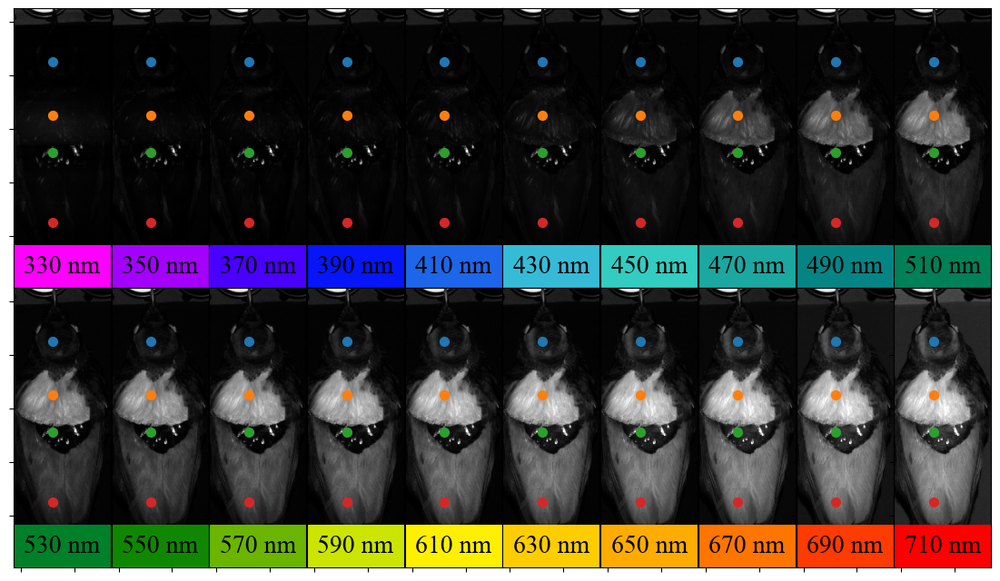

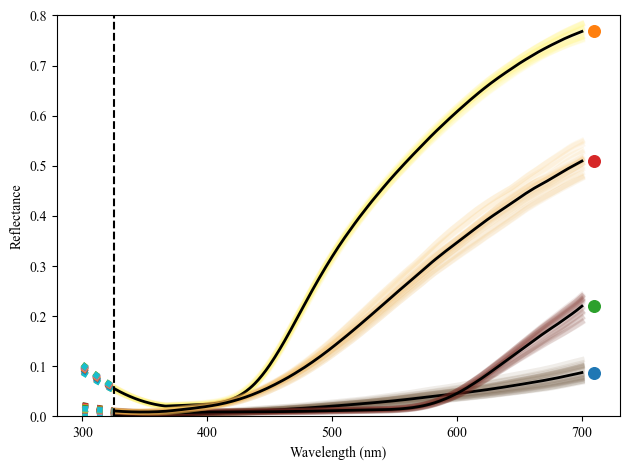

In [17]:
# For Figure 1, we generate a montage of wavelength slices of the image (a), as well as a plot of the spectra near to some sampled locations (c)
# Only save if we're on image 0
bop_plotting.montage(img, mat_contents, saveplot = image_example == 0) 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


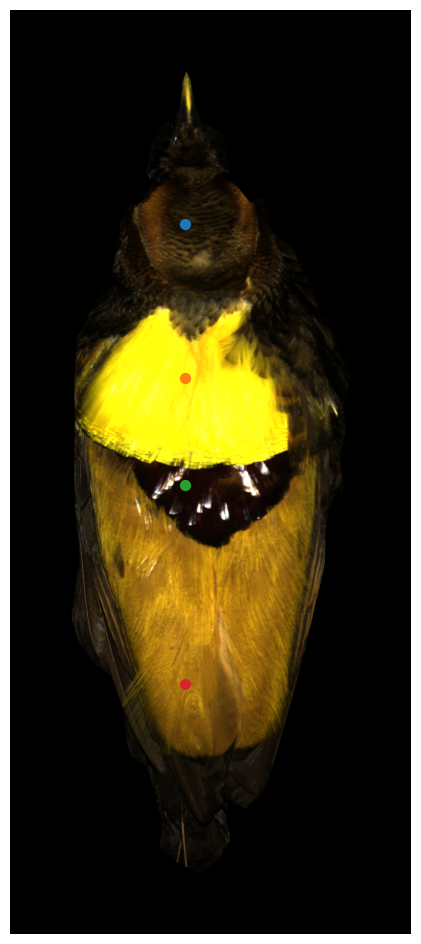

In [19]:
# For figure 1, we also generate an rgb representation of the hsi showing the sampled locations
# (Only save if we're on hsi number 0)
bop_plotting.Hyper_render(img, mat_contents, saveplot = image_example == 0, normalize_max = .5)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


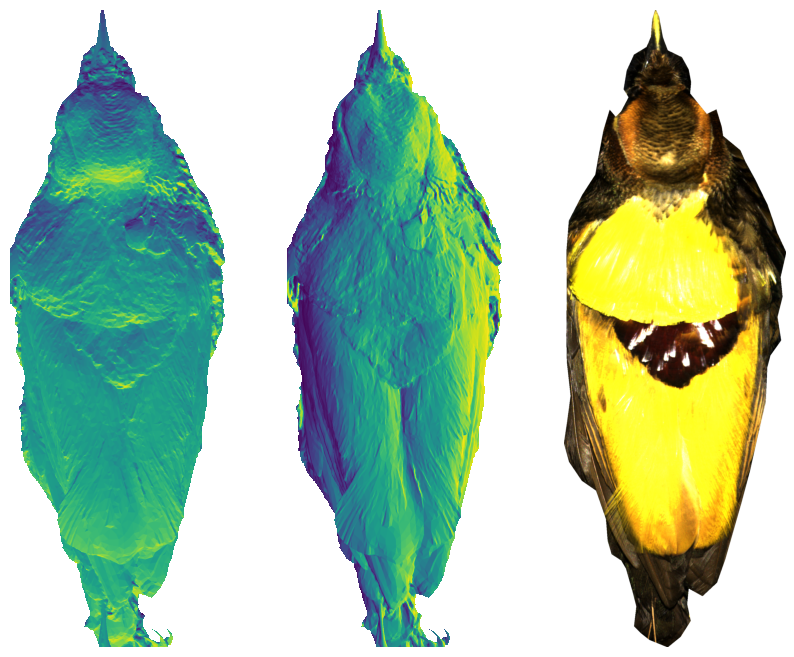

In [23]:
# For figure 4 (b, c, d) plot a false color RGB version of the example, alongside registered 3D information (plots of the normal angles from the 3D models)
# (Only save if image example is hsi image 1 (a ventral image))
lr, ud, ma, de = bop_udlr.GetUDLR(udlr_dir, 
                                  datafiles["bilfiles"][image_example], plot = False)
bop_plotting.UDLR_render(img, mat_contents, ud, lr, saveplot = image_example == 1)

['H' 'K' 'M']
Generating colors
Sample in colour-science format
Colors generated
Generating colors
Sample in colour-science format
Colors generated
Generating colors
Sample in colour-science format
Colors generated


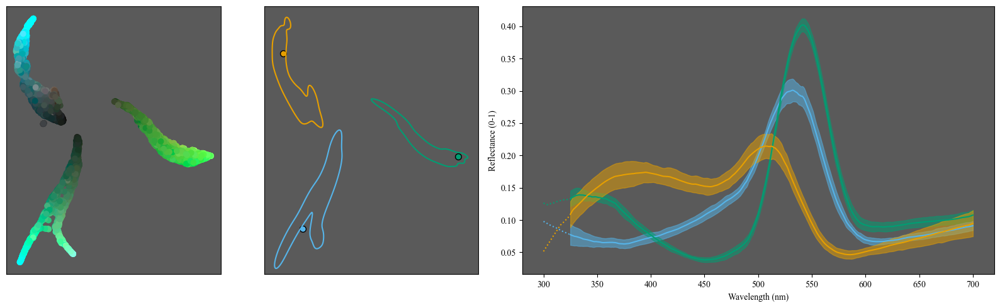

In [10]:
# Plot the tail colors of all species for Fig 7
max_point_manual = np.array([[-2.5,  -6], [18,   3.8], [-4.75,  18]])
# For figure 7 (b, c, d) plot samples taken from the tail of the bird (pca umap embedding, a KDE of the embedding, and some hand-selected spectra)
fig = bop_plotting.TailPlot(label_dict, color_dict, pltn = 'pca_umap_embedded', max_point_manual = max_point_manual)

3.14159265359
1.0471975512
-1.0471975512


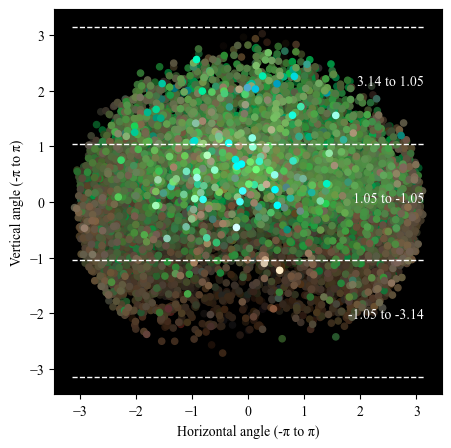

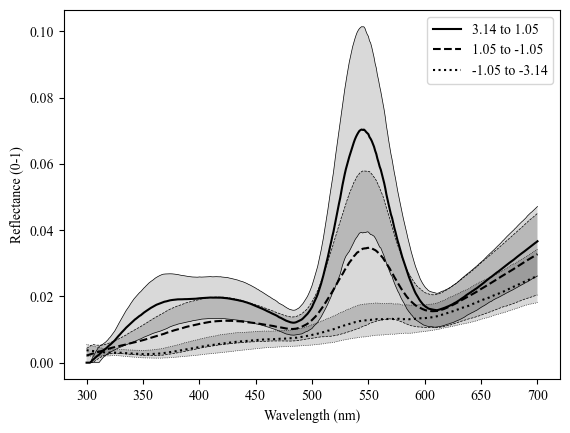

In [10]:
# For figure 4 (e, f) plot and save a figure scatter with colored dots the normal angles of the breast samples across all images,
# then discretize the points across vertical angle, and plot the median and mad of the spectra falling in those angle bins
bop_plotting.AnglePlots()

Generating colors
Sample in colour-science format
Colors generated


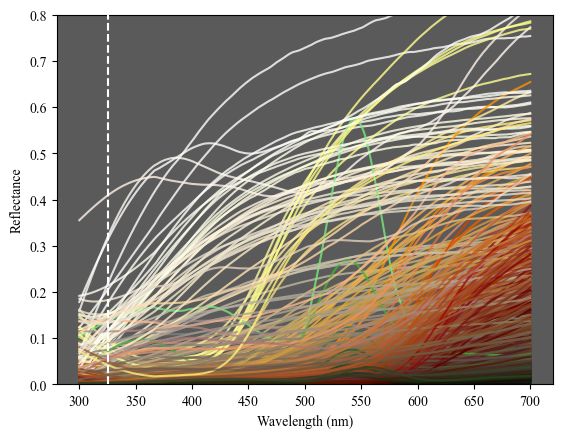

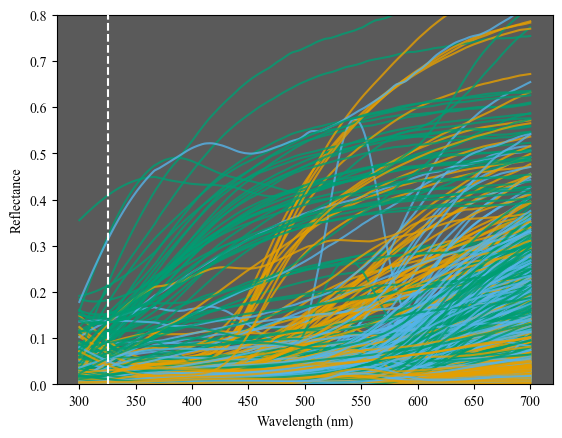

In [29]:
## For Figure 3, we want to plot a random set of the spectra sampled across all specimens for the 'Whole' patch
np.random.seed(10) # set random seed for reproducibility

# load and subset of the data for the plot
k = 0
dat = bop_analysis.LoadGather(k, directory = '../dat/Normal_hyperspectral_images/')
sub = np.arange(0, dat['arr'].shape[0],10)
np.random.shuffle(sub)
Spec = dat['arr'][sub,:]
wl = dat['wl']
sRGB = dat['sRGB'][sub,:]
spp = dat['meta']['species'][sub]

# get colors
XYZ, sRGB, Lab = utils.GetColors(Spec, wl, 2)

#### plot in srgb
# plot those spectra
fig, ax = plt.subplots(1)
ax.vlines(325, 0, 1.2, colors='White', linestyles='dashed', zorder=3)
# plot lines

for p in range(Spec.shape[0]):
        ax.plot(wl, Spec[p,:].T, alpha = 0.8, color = sRGB[p,:])
        
ax.set_xlabel('Wavelength (nm)')
ax.set_ylabel('Reflectance')
ax.set_ylim((0, .8))
ax.set_facecolor('#5A5A5A')

fig.savefig('../out/Figures/Diagram/SampleSpectra_plot.pdf', dpi = 100)

#### plot colored by species

# plot those spectra
fig, ax = plt.subplots(1)
ax.vlines(325, 0, 1.2, colors='White', linestyles='dashed', zorder=3)
# plot lines

for p in range(Spec.shape[0]):
        ax.plot(wl, Spec[p,:].T, alpha = 0.8, color = color_dict.get(spp[p]))
        
ax.set_xlabel('Wavelength (nm)')
ax.set_ylabel('Reflectance')
ax.set_ylim((0, .8))
ax.set_facecolor('#5A5A5A')

fig.savefig('../out/Figures/Diagram/SampleSpectraSpp_plot.pdf', dpi = 100)
    

Computing umap on coordinates
UMAP done in 20.803349018096924


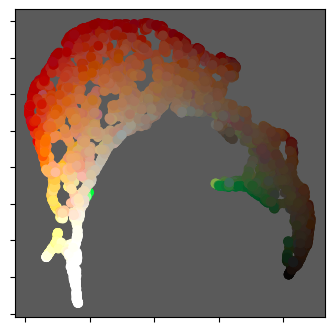

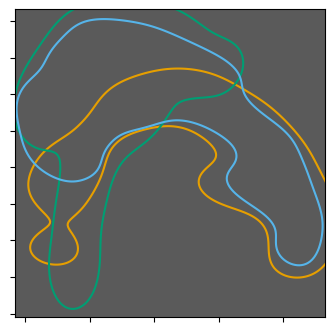

In [30]:
# Embed those distances in lower dimensional space, here PCA + UMAP
spec_pca = utils.EmbedPCA(dat['arr']) # pca
pltd = utils.EmbedDist(Coordinates = spec_pca, verbose = 0) # umap

# scatter plot
fig, ax = plt.subplots(1, figsize = (4,4))
ax.scatter(x = pltd[:,0], y = pltd[:,1], c = dat['sRGB'])
ax.set_facecolor('xkcd:black')
# get limits
left, right = ax.get_xlim()
bottom, top = ax.get_ylim()
ax.xaxis.set_ticklabels([])
ax.yaxis.set_ticklabels([])
ax.set_facecolor('#5A5A5A')
fig.savefig('../out/Figures/Diagram/SampleSpectra_dist.pdf', dpi = 100)

# kernel density plot
fig, ax = plt.subplots(1, figsize = (4,4))
sns.kdeplot(x = pltd[:,0], 
        y = pltd[:,1], 
        fill=False, 
        thresh=0, 
        hue = [label_dict[species] for species in dat['meta']['species']], # relabel
        palette = dict((label_dict[key], value) for (key, value) in color_dict.items()),
        common_norm = False, 
        legend = False,
        levels=[0.2],
        ax=ax)
ax.set_facecolor('xkcd:black')
ax.set_xlim(left, right)
ax.set_ylim(bottom, top)
ax.xaxis.set_ticklabels([])
ax.yaxis.set_ticklabels([])
ax.set_facecolor('#5A5A5A')

fig.savefig('../out/Figures/Diagram/SampleSpectraSpp_dist.pdf', dpi = 100)


Previous matfile loaded
Sampling across all images for mask 0
1 of 24
Selected 249 samples
Samples need averaging
Processing and averaging
Finding udlr for samples
2 of 24
Selected 244 samples
Samples need averaging
Processing and averaging
Finding udlr for samples
3 of 24
Selected 243 samples
Samples need averaging
Processing and averaging
Finding udlr for samples
4 of 24
Selected 247 samples
Samples need averaging
Processing and averaging
Finding udlr for samples
5 of 24
Selected 250 samples
Samples need averaging
Processing and averaging
Finding udlr for samples
6 of 24
Selected 251 samples
Samples need averaging
Processing and averaging
Finding udlr for samples
7 of 24
Selected 245 samples
Samples need averaging
Processing and averaging
Finding udlr for samples
8 of 24
Selected 248 samples
Samples need averaging
Processing and averaging
Finding udlr for samples
9 of 24
Selected 248 samples
Samples need averaging
Processing and averaging
Finding udlr for samples
10 of 24
Selected 25

100%|██████████████████████████████████████████████████████████████████████████████| 5944/5944 [01:47<00:00, 55.06it/s]


Computing umap on distance matrix
UMAP(metric='precomputed', verbose=1)
Tue Sep 10 14:38:06 2024 Construct fuzzy simplicial set
Tue Sep 10 14:38:06 2024 Finding Nearest Neighbors
Tue Sep 10 14:38:09 2024 Finished Nearest Neighbor Search
Tue Sep 10 14:38:09 2024 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
Tue Sep 10 14:38:16 2024 Finished embedding
UMAP done in 10.36732292175293
Computing umap on distance matrix
UMAP(metric='precomputed', verbose=1)
Tue Sep 10 14:38:17 2024 Construct fuzzy simplicial set
Tue Sep 10 14:38:17 2024 Finding Nearest Neighbors
Tue Sep 10 14:38:17 2024 Finished Nearest Neighbor Search
Tue Sep 10 14:38:17 2024 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
Tue Sep 10 14:38:23 2024 Finished embedding
UMAP done in 6.531422138214111
Computing umap on coordinates
UMAP( verbose=1)
Tue Sep 10 14:38:23 2024 Construct fuzzy simplicial set
Tue Sep 10 14:38:23 2024 Finding Nearest Neighbors
Tue Sep 10 14:38:23 2024 Building RP forest with 9 trees
Tue Sep 10 14:38:23 2024 NN descent for 13 iterations
	 1  /  13
	 2  /  13
	 3  /  13
	Stopping threshold met -- exiting after 3 iterations
Tue Sep 10 14:38:23 2024 Finished Nearest Neighbor Search
Tue Sep 10 14:38:23 2024 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
Tue Sep 10 14:38:30 2024 Finished embedding
UMAP done in 7.278465986251831
Computing umap on coordinates
UMAP( verbose=1)
Tue Sep 10 14:38:30 2024 Construct fuzzy simplicial set
Tue Sep 10 14:38:30 2024 Finding Nearest Neighbors
Tue Sep 10 14:38:30 2024 Building RP forest with 9 trees
Tue Sep 10 14:38:31 2024 NN descent for 13 iterations
	 1  /  13
	 2  /  13
	Stopping threshold met -- exiting after 2 iterations
Tue Sep 10 14:38:31 2024 Finished Nearest Neighbor Search
Tue Sep 10 14:38:31 2024 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
Tue Sep 10 14:38:36 2024 Finished embedding
UMAP done in 5.861696004867554
Sampling across all images for mask 0
1 of 24
Selected 249 samples
Samples need averaging
Processing and averaging
Finding udlr for samples
2 of 24
Selected 244 samples
Samples need averaging
Processing and averaging
Finding udlr for samples
3 of 24
Selected 243 samples
Samples need averaging
Processing and averaging
Finding udlr for samples
4 of 24
Selected 247 samples
Samples need averaging
Processing and averaging
Finding udlr for samples
5 of 24
Selected 250 samples
Samples need averaging
Processing and averaging
Finding udlr for samples
6 of 24
Selected 251 samples
Samples need averaging
Processing and ave

100%|██████████████████████████████████████████████████████████████████████████████| 5944/5944 [01:45<00:00, 56.51it/s]


Computing umap on distance matrix
UMAP(metric='precomputed', verbose=1)
Tue Sep 10 14:43:09 2024 Construct fuzzy simplicial set
Tue Sep 10 14:43:09 2024 Finding Nearest Neighbors
Tue Sep 10 14:43:09 2024 Finished Nearest Neighbor Search
Tue Sep 10 14:43:09 2024 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
Tue Sep 10 14:43:16 2024 Finished embedding
UMAP done in 7.394388198852539
Computing umap on distance matrix
UMAP(metric='precomputed', verbose=1)
Tue Sep 10 14:43:16 2024 Construct fuzzy simplicial set
Tue Sep 10 14:43:16 2024 Finding Nearest Neighbors
Tue Sep 10 14:43:16 2024 Finished Nearest Neighbor Search
Tue Sep 10 14:43:16 2024 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
Tue Sep 10 14:43:22 2024 Finished embedding
UMAP done in 6.479403734207153
Computing umap on coordinates
UMAP( verbose=1)
Tue Sep 10 14:43:22 2024 Construct fuzzy simplicial set
Tue Sep 10 14:43:22 2024 Finding Nearest Neighbors
Tue Sep 10 14:43:22 2024 Building RP forest with 9 trees
Tue Sep 10 14:43:22 2024 NN descent for 13 iterations
	 1  /  13
	 2  /  13
	Stopping threshold met -- exiting after 2 iterations
Tue Sep 10 14:43:23 2024 Finished Nearest Neighbor Search
Tue Sep 10 14:43:23 2024 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
Tue Sep 10 14:43:30 2024 Finished embedding
UMAP done in 7.675721883773804
Computing umap on coordinates
UMAP( verbose=1)
Tue Sep 10 14:43:30 2024 Construct fuzzy simplicial set
Tue Sep 10 14:43:30 2024 Finding Nearest Neighbors
Tue Sep 10 14:43:30 2024 Building RP forest with 9 trees
Tue Sep 10 14:43:30 2024 NN descent for 13 iterations
	 1  /  13
	 2  /  13
	Stopping threshold met -- exiting after 2 iterations
Tue Sep 10 14:43:30 2024 Finished Nearest Neighbor Search
Tue Sep 10 14:43:30 2024 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
Tue Sep 10 14:43:36 2024 Finished embedding
UMAP done in 5.802186489105225


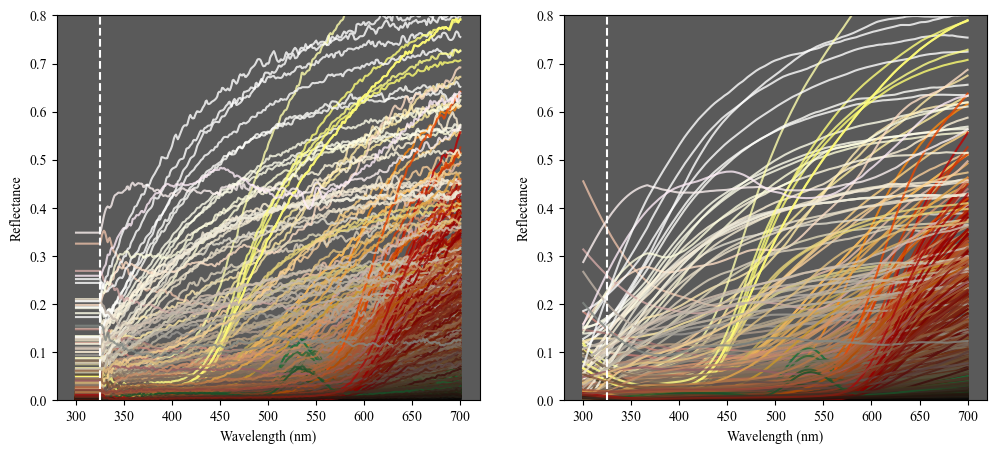

In [31]:
# To show how the filtering effects the results we'll show a plot of the samples from the 'whole'
# patch across all the images plotted with differing window length for savgol filtering. Fig S2
# Note that we're re-sampling so this takes a while.

fig, ax = plt.subplots(1,2, figsize = (12,5))

# Find metadata about mask availability for each file (i.e. what masks do we have in what image?)
matinfo = bop_sampling.FindMasks(datafiles, "../dat/Normal_hyperspectral_images")
# Find the samples for each - spread desire across the images per specimen in which a patch is visible
desire = 1000 # how many spectra would we want per bird per patch? 1000 in main analysis, 1000 for tilted, how many for Tail?
desirematrix = desire/matinfo['divider'] # should be desired sample given the number of facings for each bird.
desirematrix[matinfo['hasmask']==0]=0 # missing masks shouldn't matter but setting to 0 anyway

k = 0

dat = bop_analysis.ProcessData(datafiles, udlr_dir, k, desirematrix, "../dat/Normal_hyperspectral_images", window_length = 0, color_scale = 2, saveout = False)

np.random.seed(2000) # set random seed for reproducibility
sub = np.random.randint(0, dat['arr'].shape[0], 595)
np.random.shuffle(sub)

Spec = dat['arr'][sub,:]
wl = dat['wl']
sRGB = dat['sRGB'][sub,:]
spp = dat['meta']['species'][sub]

# plot those spectra
ax[0].vlines(325, 0, 1.2, colors='White', linestyles='dashed', zorder=3)
# plot lines
for p in range(Spec.shape[0]):
        ax[0].plot(wl, Spec[p,:].T, alpha = 0.8, color = sRGB[p,:])
ax[0].set_xlabel('Wavelength (nm)')
ax[0].set_ylabel('Reflectance')
ax[0].set_ylim((0, .8))
ax[0].set_facecolor('#5A5A5A')

dat = bop_analysis.ProcessData(datafiles, udlr_dir, k, desirematrix, "../dat/Normal_hyperspectral_images", window_length = 45, color_scale = 2, saveout = False)

Spec = dat['arr'][sub,:]
wl = dat['wl']
sRGB = dat['sRGB'][sub,:] 
spp = dat['meta']['species'][sub]

# plot those spectra
ax[1].vlines(325, 0, 1.2, colors='White', linestyles='dashed', zorder=3)
# plot lines
for p in range(Spec.shape[0]):
        ax[1].plot(wl, Spec[p,:].T, alpha = 0.8, color = sRGB[p,:])
ax[1].set_xlabel('Wavelength (nm)')
ax[1].set_ylabel('Reflectance')
ax[1].set_ylim((0, .8))
ax[1].set_facecolor('#5A5A5A')

fig.savefig('../out/Figures/Diagram/Window_length_plot.png', dpi = 100)

Working on 1 of 5
Working on 2 of 5
Generating colors
Sample in colour-science format
Colors generated
Generating colors
Sample in colour-science format
Colors generated
Generating colors
Sample in colour-science format
Colors generated
Working on 3 of 5
Generating colors
Sample in colour-science format
Colors generated
Generating colors
Sample in colour-science format
Colors generated
Generating colors
Sample in colour-science format
Colors generated
Working on 4 of 5
Generating colors
Sample in colour-science format
Colors generated
Generating colors
Sample in colour-science format
Colors generated
Generating colors
Sample in colour-science format
Colors generated
Working on 5 of 5
Generating colors
Sample in colour-science format
Colors generated
Generating colors
Sample in colour-science format
Colors generated
Generating colors
Sample in colour-science format
Colors generated


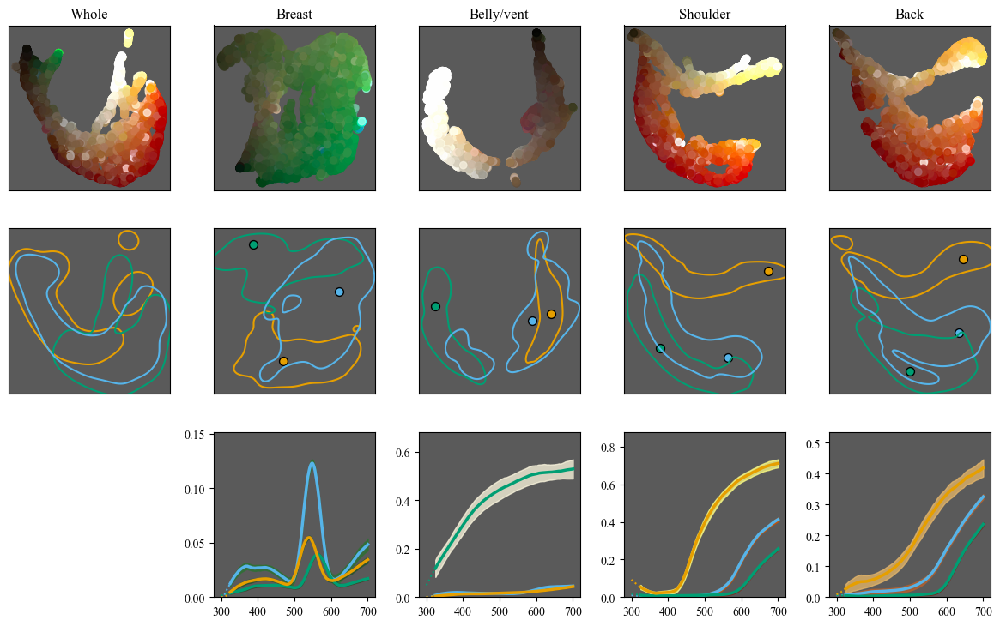

In [32]:
# Figure 5
# %matplotlib qt 
%matplotlib inline
pltn = 'pca_umap_embedded' # can choose any of tSNE, umap, cmds measures of KLPD or dSh
fig = bop_plotting.BasicPlot(pltn, mat_contents, label_dict, color_dict)

Working on 1 of 5
Working on 2 of 5
Generating colors
Sample in colour-science format
Colors generated
Generating colors
Sample in colour-science format
Colors generated
Generating colors
Sample in colour-science format
Colors generated
Working on 3 of 5
Generating colors
Sample in colour-science format
Colors generated
Generating colors
Sample in colour-science format
Colors generated
Generating colors
Sample in colour-science format
Colors generated
Working on 4 of 5
Generating colors
Sample in colour-science format
Colors generated
Generating colors
Sample in colour-science format
Colors generated
Generating colors
Sample in colour-science format
Colors generated
Working on 5 of 5
Generating colors
Sample in colour-science format
Colors generated
Generating colors
Sample in colour-science format
Colors generated
Generating colors
Sample in colour-science format
Colors generated


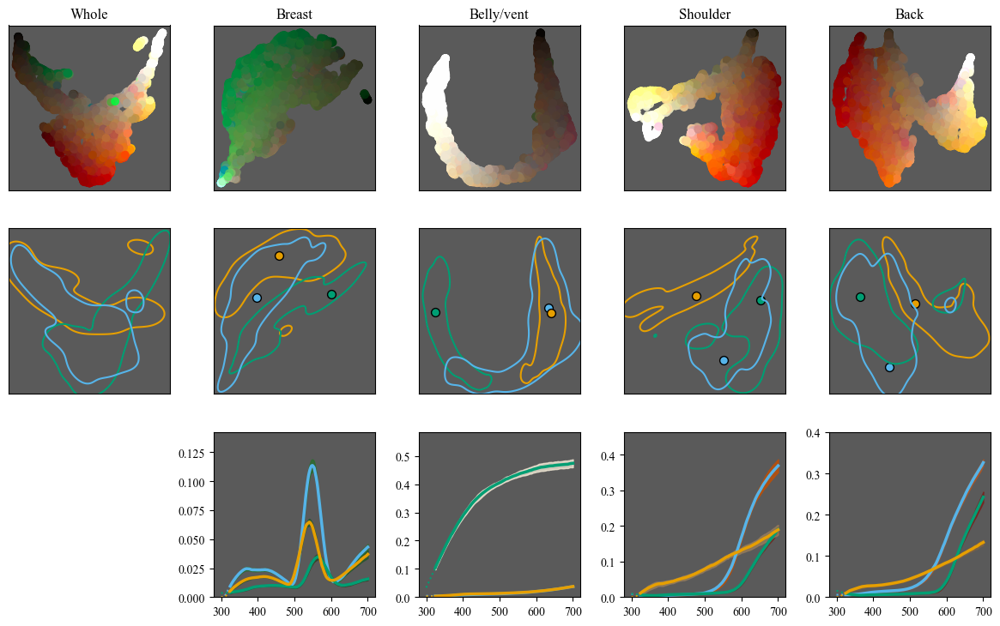

In [33]:
# Figure S5 - KLPD umap embedding of samples
# %matplotlib qt 
%matplotlib inline
pltn = 'KLPD_umap_embedded' # can choose any of tSNE, umap, cmds measures of KLPD or dSh
fig = bop_plotting.BasicPlot(pltn, mat_contents, label_dict, color_dict)

Working on 1 of 5
Working on 2 of 5
Generating colors
Sample in colour-science format
Colors generated
Generating colors
Sample in colour-science format
Colors generated
Generating colors
Sample in colour-science format
Colors generated
Working on 3 of 5
Generating colors
Sample in colour-science format
Colors generated
Generating colors
Sample in colour-science format
Colors generated
Generating colors
Sample in colour-science format
Colors generated
Working on 4 of 5
Generating colors
Sample in colour-science format
Colors generated
Generating colors
Sample in colour-science format
Colors generated
Generating colors
Sample in colour-science format
Colors generated
Working on 5 of 5
Generating colors
Sample in colour-science format
Colors generated
Generating colors
Sample in colour-science format
Colors generated
Generating colors
Sample in colour-science format
Colors generated


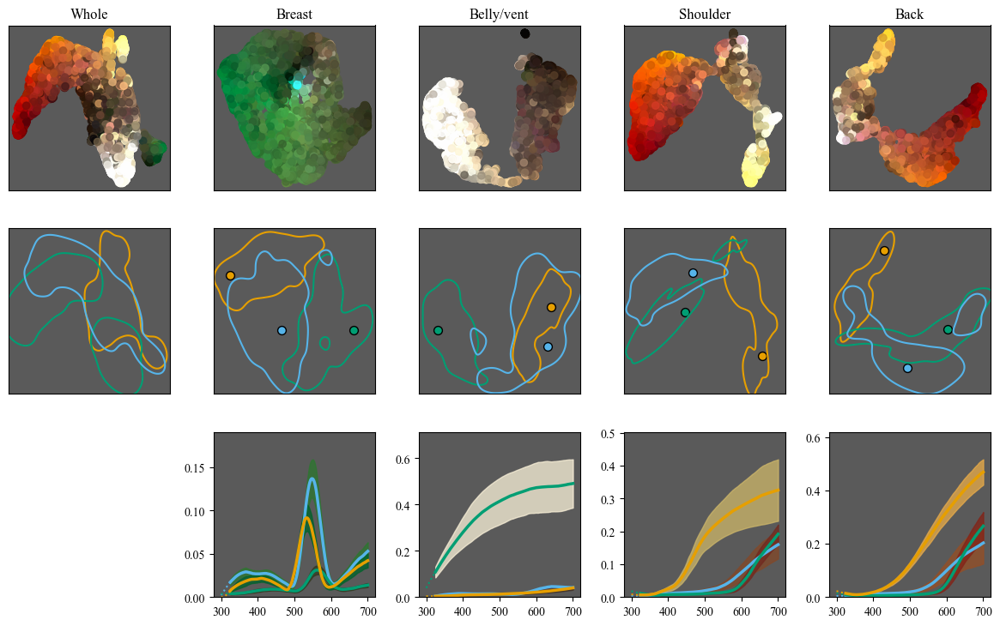

In [34]:
# Fig S6 - dSH umap embedding of samples
# %matplotlib qt 
pltn = 'dSh_umap_embedded' # can choose any of tSNE, umap, cmds measures of KLPD or dSh
fig = bop_plotting.BasicPlot(pltn, mat_contents, label_dict, color_dict)

Working on 1 of 5
Plotting avb
Working on 2 of 5
Plotting avb
Working on 3 of 5
Plotting avb
Working on 4 of 5
Plotting avb
Working on 5 of 5
Plotting avb


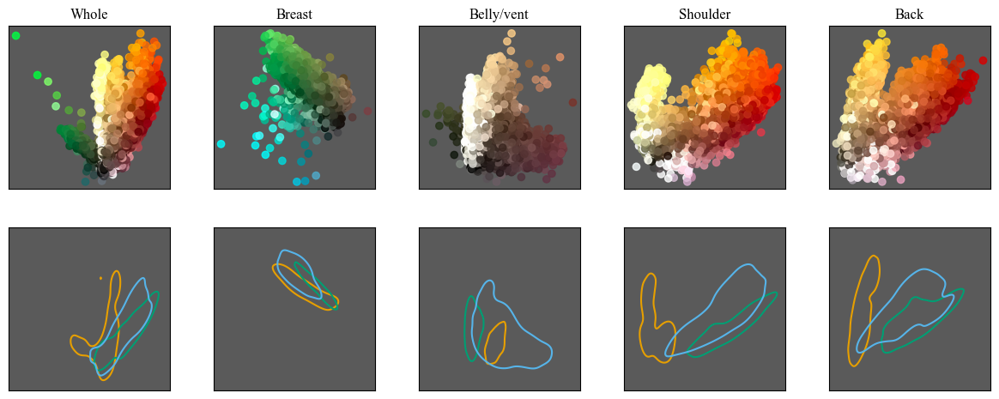

In [35]:
# Figure not shown in paper, plot of LAB coordinates for samples
# %matplotlib qt 
pltn = 'Lab' # 'Lab' gives Lxa, others clearer
fig = bop_plotting.BasicPlot(pltn, mat_contents, label_dict, color_dict, lab = 'avb')

In [38]:
# # Figure not shown in paper, plot of the CIE XYy coordinates of the samples
# includeWhole = 1 # include the first mask in the columns or exclude - as defined, this is whole mask
# fig = bop_plotting.CIEXYyPlot_two(mat_contents, includeWhole, label_dict, color_dict) # show = False no longer seems to be working. expect
# # prints of some empty plots here as figure is constructed, due to construction of colour.plotting.diagrams.plot_chromaticity_diagram I believe
# fig

Working on 1 of 5
Working on 2 of 5
Working on 3 of 5
Working on 4 of 5
Working on 5 of 5


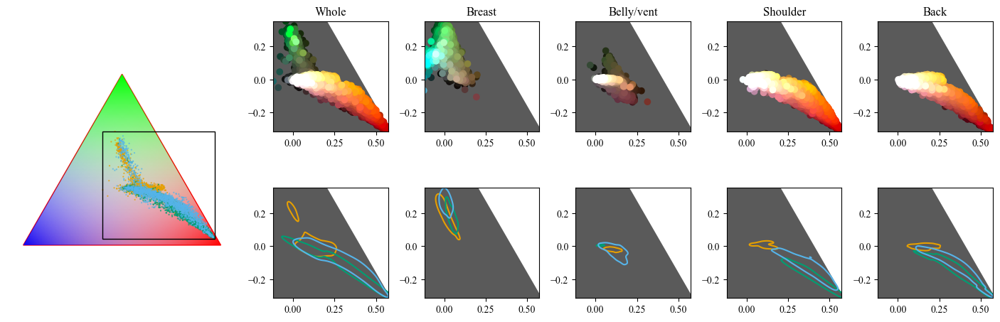

In [37]:
# Plot a collection of triangular representations of the tetrahedral color locations of each patch across specimens
# Fig 6 in main paper.
%matplotlib inline
fig = bop_plotting.tXYZplot(mat_contents, 1,  label_dict, color_dict, up = 'u')

In [11]:
# Figure S16, 3D tetrahedral plot of samples
fig = bop_plotting.tcs_multi(label_dict, color_dict)
fig

Working on 1 of 6
Working on 2 of 6
0.2889654273338917
Doing kde
Using stats.guassian_kde
Calculating KDE on points
Doing kde
Using stats.guassian_kde
Calculating KDE on points
Doing kde
Using stats.guassian_kde
Calculating KDE on points
Working on 3 of 6
0.2878440665960965
Doing kde
Using stats.guassian_kde
Calculating KDE on points
Doing kde
Using stats.guassian_kde
Calculating KDE on points
Doing kde
Using stats.guassian_kde
Calculating KDE on points
Working on 4 of 6
0.28934241417289047
Doing kde
Using stats.guassian_kde
Calculating KDE on points
Doing kde
Using stats.guassian_kde
Calculating KDE on points
Doing kde
Using stats.guassian_kde
Calculating KDE on points
Working on 5 of 6
0.2888614030548942
Doing kde
Using stats.guassian_kde
Calculating KDE on points
Doing kde
Using stats.guassian_kde
Calculating KDE on points
Doing kde
Using stats.guassian_kde
Calculating KDE on points
Working on 6 of 6
0.2887438700349926
Doing kde
Using stats.guassian_kde
Calculating KDE on points
Doi

In [39]:
# Figure S17, RNL color space plot of samples
fig = bop_plotting.RNL_multi(label_dict, color_dict)
fig

Working on 1 of 5
Working on 2 of 5
0.2878440665960965
Doing kde
Using stats.guassian_kde
Calculating KDE on points
Doing kde
Using stats.guassian_kde
Calculating KDE on points
Doing kde
Using stats.guassian_kde
Calculating KDE on points
Working on 3 of 5
0.28934241417289047
Doing kde
Using stats.guassian_kde
Calculating KDE on points
Doing kde
Using stats.guassian_kde
Calculating KDE on points
Doing kde
Using stats.guassian_kde
Calculating KDE on points
Working on 4 of 5
0.2888614030548942
Doing kde
Using stats.guassian_kde
Calculating KDE on points
Doing kde
Using stats.guassian_kde
Calculating KDE on points
Doing kde
Using stats.guassian_kde
Calculating KDE on points
Working on 5 of 5
0.2887438700349926
Doing kde
Using stats.guassian_kde
Calculating KDE on points
Doing kde
Using stats.guassian_kde
Calculating KDE on points
Doing kde
Using stats.guassian_kde
Calculating KDE on points


(4, 204)


100%|██████████████████████████████████████████████████████████████████████████████| 5039/5039 [04:46<00:00, 17.61it/s]


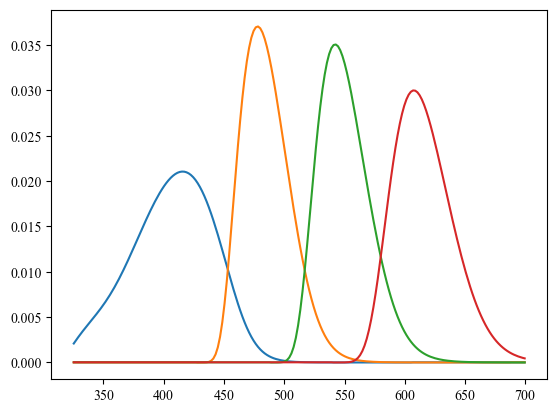

In [40]:
## What follows is an example of converting a hyperspectral image into a cone-catch image compatible with MICA/QCPA

from tqdm import tqdm # allows us to display a progress bar

# load a HSI image
img = envi.open(datafiles["hdrfiles"][image_example], datafiles["bilfiles"][image_example])
owl = np.array(img.bands.centers)
# get metadata for 99% standard
mat_contents = sio.loadmat(datafiles["matfiles"][image_example], struct_as_record=False, squeeze_me=True)
mat_contents = mat_contents['ImStruct']

# load visual sensitivity (in this case, average uv bird cones)
df = pd.read_csv( '../dat/Sensi/Avg_v.csv', index_col=None).to_numpy()
wl = df[:,0]
df = df[:,1:]

# interpolate sensitivity to wavelengths of 325>x<700, otherwise matching the band centers of the hyperspectral image
# an alternative might be to interpolate/extrapolate the entire hyperspectral image to match the sensitivity
# for simplicity here, we don't
wl, df = utils.InterpSample(wl, df.T, wlnew = owl[np.logical_and(owl > 325, owl < 700)])
df = np.divide(df, np.sum(df, axis = 1)[:,None]) # normalize to area = 1

# plot, and print shape
plt.plot(wl, df.T)
print(df.shape)

# go through pixels of our hyperspectral image, and for each find usml value out (integration by multiplication)
nrows = img.shape[0]
ncols = img.shape[1]
chans = df.shape[0]
x_out = np.zeros((nrows, ncols, chans)) # note that QCPA expects last channel to be luminance, which we don't use here, but could do if we added a 5th color sensitivity channel
which_bands = np.logical_and(owl > 325, owl < 700) # logical

for i in tqdm(range(nrows)): # tqdm displays a timer for the processing
    for j in range(ncols): 
        x = img[i, j] # one can define bands, but it is much slower, as apparently is loading a row at a time and vectorizing that way
        x = np.divide(x, mat_contents.ref99)
        x_out[i,j,:] = np.sum(np.multiply(x[which_bands], df), axis = 1)

# add a (currently blank) image channel to represent the luminance channel
x_out = np.dstack([x_out, np.zeros((nrows, ncols))])

float32


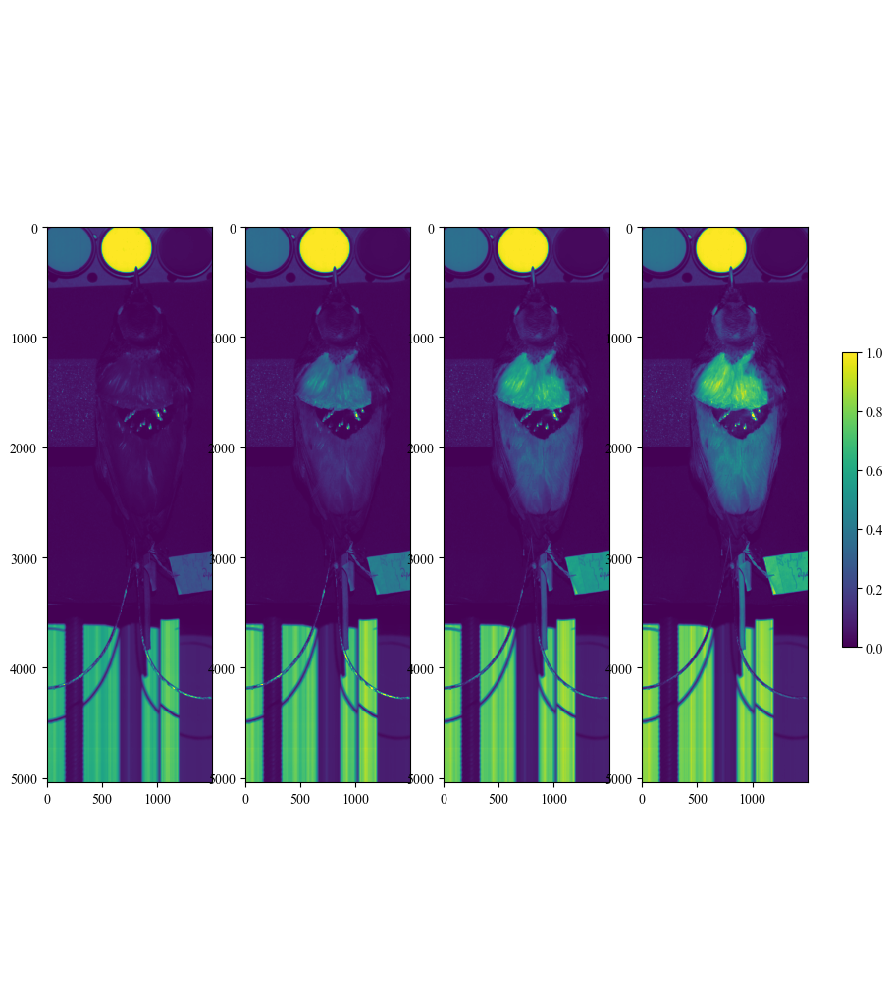

In [41]:
# plot the resulting images
fig, ax = plt.subplots(nrows = 1, ncols = 4, figsize = (10,10))
vmin = 0
vmax = 1
a = ax[0].imshow(x_out[:,:,0], vmin = vmin, vmax = vmax)
ax[1].imshow(x_out[:,:,1], vmin = vmin, vmax = vmax)
ax[2].imshow(x_out[:,:,2], vmin = vmin, vmax = vmax)
ax[3].imshow(x_out[:,:,3], vmin = vmin, vmax = vmax)
cax = fig.add_axes([0.85, 0, 0.1, 1])
fig.colorbar(a, ax=cax)
cax.set_axis_off()

# make a version that is an unsigned 32 bit image and save it out
x_out_norm = x_out
x_out_norm[x_out_norm > 1] = 1
x_out_norm = x_out_norm * 2**32
x_out_norm = x_out_norm.astype('float32')
print(x_out_norm.dtype) 

im = Image.fromarray(x_out_norm[:,:,0])
imlist = []
for m in range(x_out_norm.shape[2]):
    imlist.append(Image.fromarray(x_out_norm[:,:,m]))

# save that out to use in mica/QCPA
imlist[0].save("../out/test.tif", compression="None", save_all=True,
               append_images=imlist[1:])

Got USML + relative USML
Generating colors
Sample in colour-science format
Colors generated


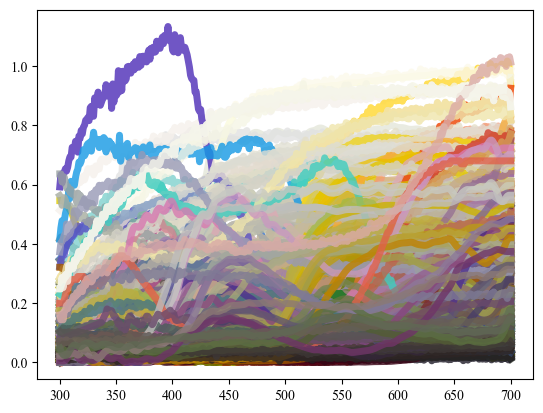

In [42]:
## Import the plumage and plant reflectance datasets, note these data available on request
# from authors of https://academic.oup.com/beheco/article/22/5/1042/252714
# This is used in both fig S3 and S4

s_df = pd.read_csv( '../dat/Natural_spectra/Stoddard_965_Bird_Plumage_Colors_May2020.csv', index_col=None).to_numpy()
s_wl = s_df[:,0]
s_df = s_df[:,1:]
wl, df = utils.InterpSample(s_wl,s_df.T,wlnew = np.arange(300, 701))

s_df  = pd.read_csv( '../dat/Natural_spectra/Stoddard_Plant_Gamut_2011.csv', index_col=None).to_numpy()
s_wl = s_df[:,0]
s_df = s_df[:,1:]
wl_2, df_2 = utils.InterpSample(s_wl,s_df.T,wlnew = np.arange(300, 701))

if np.all(wl == wl_2):
    df = np.vstack((df, df_2))
else:
    raise Exception("Interpolation didn't work")

df = df/100 # spectra are stored as percentages, here we're using 0-1
df[df<0] = 0

# generate colors for these spectra and plot
usml, relusml, txyz = utils.Spec2usml(df, wl)
XYZ, sRGB, Lab = utils.GetColors(df, wl, color_scale = 1)

# plot the spectra
for i in np.random.randint(0, df.shape[0], 500):
    plt.plot(wl, df[i,:],
           lw=5, color = sRGB[i,:], alpha=0.8)


[300 390 480 570 660]


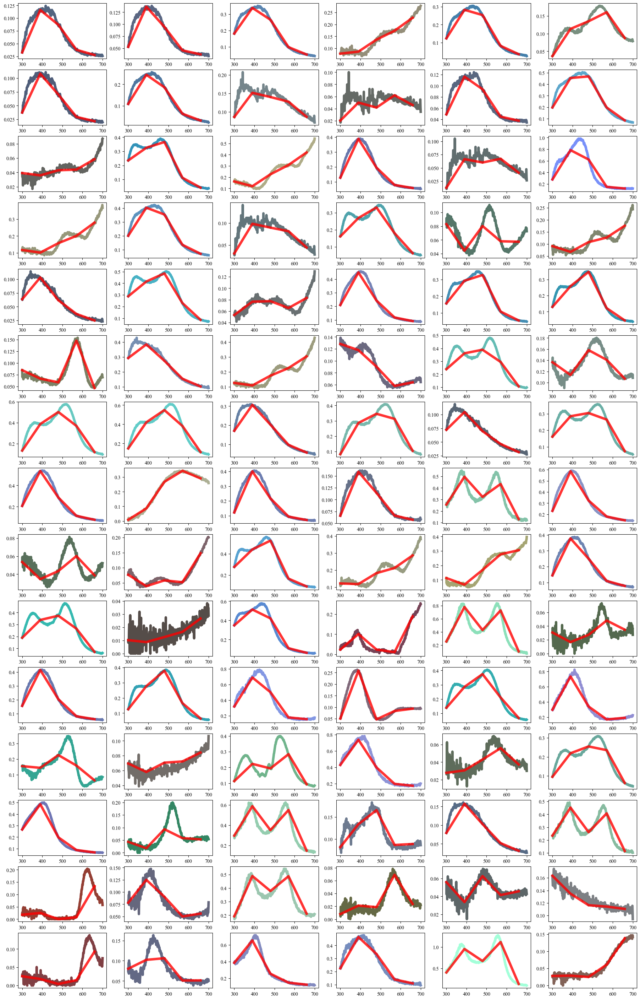

In [43]:
## Generate a diagrammatic downsampling to overplot over the data for Fig S4
wl_down, df_down = utils.InterpSample(wl, df, wlnew = np.arange(300, 700, 90))
print(wl_down)

# up-sample linearly
df_down_up = np.empty(df.shape)
for i in range(df_down.shape[1]):
    df_down_up[i,:] = np.interp(wl, wl_down, df_down[i,:])

# get absolute error
eudiff = np.abs(np.sum(df, axis = 1) - np.sum(df_down_up, axis = 1))
# or maximum error
eudiff = np.max(np.abs(np.subtract(df, df_down_up)), axis = 0)
select = np.argsort(-eudiff)[0:(15*6)]
n_select = len(select)

# and plot a selection of the 'worst' ones
fig, ax = plt.subplots(nrows = 15, ncols = 6, figsize = (15 * 1.5, 30 * 1.2))
for i in range(n_select):
    ax_id = np.unravel_index(i, (15,6))
    ax[ax_id].plot(wl, df[select[i],:],
           lw=5, color = sRGB[select[i],:], alpha=0.8)

    ax[ax_id].plot(wl_down, df_down[select[i],:],
           lw=5, color = 'red', alpha=0.8)
plt.show()

fig.savefig('../out/Figures/Spectral_downsample.png', dpi = 300, bbox_inches="tight")

# So that serves as a demo of the missing information with a simple interpolation to 5 channels
# May be better to integrate with a camera model from MICA to say the same thing? Hm, but what would the x axis really be there?
# Since there's a broad range of wavelengths. Do this with wavelength gap of 90 and 10nm, to answer two different points.

Cutting original spectra to >325
Filtering spectra with savgol_filter, extrapolation will use pchip
Interpolated spectra to 1nm from 325 to 700
Spectra now 300 to 700


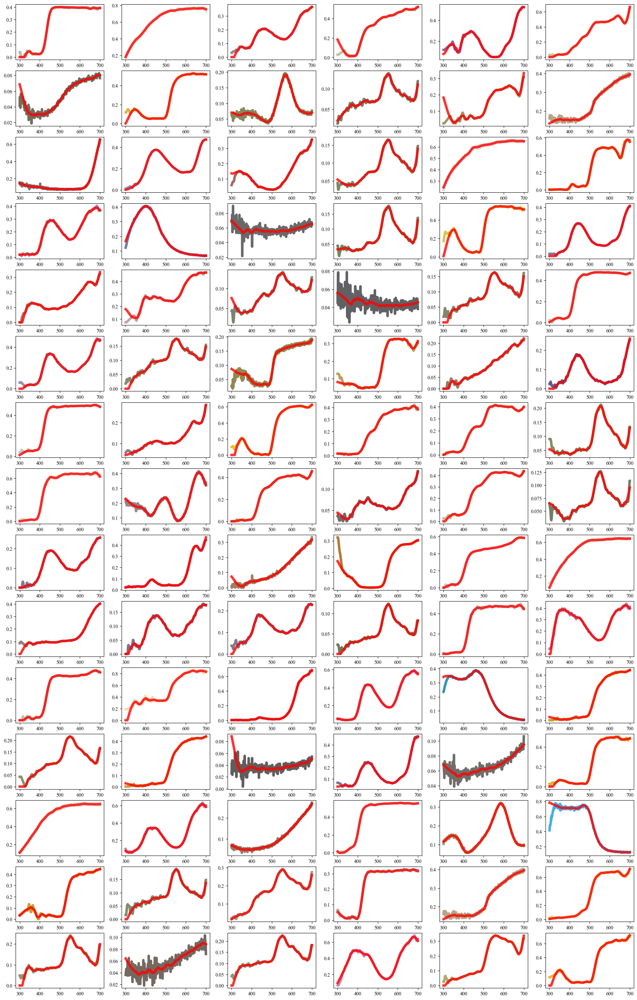

In [44]:
## ground-truth the extrapolation used in paper by overlaying extrapolated, filtered versions of natural spectra
# Figure S3
wl_filt, df_filt = utils.InterpExtrapSample(wl, df, wlnew = np.arange(325, 701, 1), wlout = np.arange(300, 701, 1), window_length = 45)

# plot random ones from the extrapolation
n_select = 90
np.random.seed(2000)
select = np.random.randint(0, df.shape[0], n_select)
fig, ax = plt.subplots(nrows = 15, ncols = 6, figsize = (15 * 1.5, 30 * 1.2))
for i in range(n_select):
    ax_id = np.unravel_index(i, (15,6))
    
    ax[ax_id].plot(wl, df[select[i],:],
           lw=5, color = sRGB[select[i],:], alpha=0.8)

    ax[ax_id].plot(wl_filt, df_filt[select[i],:],
           lw=5, color = 'red', alpha=0.8)
plt.show()

fig.savefig('../out/Figures/Spectral_groundtruth.png', dpi = 300, bbox_inches="tight")

In [45]:
# Make up two datasets for a pavo analysis of color distances - Analysis described for Fig S9
# then use code in out/Ranalysis to generate Fig S9 and out interpretations of which patches
# are discriminable - given only their median spectrum. Note though that RNL space plot indicates
# that for all patches, it appears that multiple discriminable colors are contained in each patch.

maskin = [0, 2, 3, 4, 6] # list used patches
# load names for patches from metadata
mat_contents = sio.loadmat(datafiles["matfiles"][0], struct_as_record=False, squeeze_me=True)
mat_contents = mat_contents['ImStruct']

# for each mask
for i in range(len(maskin)):

    print('Working on ' + str(i+1) + ' of ' + str(len(maskin)))

    # load the relevant data
    if maskin[i]==2: # for breast, use tilted image samples instead
        directory = '../dat/Tilted_hyperspectral_images'
        dat = bop_analysis.LoadGather(maskin[i], directory = directory)
    else:
        directory = '../dat/Normal_hyperspectral_images'
        dat = bop_analysis.LoadGather(maskin[i], directory = directory)
        
    name =  os.path.basename(directory) + '_' + mat_contents.bwlist[dat['meta']['mask'][0].astype(int)]
    print(name)

    # collect just the mean spectrum for each specimen
    out=np.zeros((len(np.unique(dat['meta']['specimen'])), len(dat['wl'])))
    names = []
    for ii, k in enumerate(np.unique(dat['meta']['specimen'])):
        select = dat['meta']['specimen'] == k
        temp = dat['arr'][select]
        out[ii,] = np.median(temp, axis = 0) * 100 # pavo typically has reflectance as a percentage
        names.append(np.unique(dat['meta']['species'][select])[0] + "_" + np.unique(dat['meta']['specimen'][select])[0] + "_" + mat_contents.bwlist[dat['meta']['mask'][select].astype(int)[0]])
        
    # First, just the array but with abritrarily named columns
    r_spec = pd.DataFrame(data = out.T, index = dat['wl'], columns = names)
    r_spec.to_csv("../out/Ranalysis/" + name + '_spec.csv')
    

Working on 1 of 5
Normal_hyperspectral_images_Whole
Working on 2 of 5
Tilted_hyperspectral_images_Breast
Working on 3 of 5
Normal_hyperspectral_images_Belly
Working on 4 of 5
Normal_hyperspectral_images_Shoulder
Working on 5 of 5
Normal_hyperspectral_images_BackBottom
